# Assignment 1

## Formalia:

Please read the [assignment overview page](https://github.com/suneman/socialdata2023/wiki/Assignments) carefully before proceeding. This page contains information about formatting (including formats etc.), group sizes, and many other aspects of handing in the assignment. 

_If you fail to follow these simple instructions, it will negatively impact your grade!_

**Due date and time**: The assignment is due on Monday February 27th, 2023 at 23:55. Hand in your files via [http://peergrade.io](http://peergrade.io/).

**Peergrading date and time**: _Remember that after handing in you have 1 week to evaluate a few assignments written by other members of the class_. 

## A1 Part 1: Visualizing patterns in the data

In this sub-assignment, we recreate some of the plots from Week 2. We look only at the focus-crimes.

In [1]:
focuscrimes = set(['WEAPON LAWS', 'PROSTITUTION', 'DRIVING UNDER THE INFLUENCE', 'ROBBERY', 'BURGLARY', 'ASSAULT', 'DRUNKENNESS', 'DRUG/NARCOTIC', 'TRESPASS', 'LARCENY/THEFT', 'VANDALISM', 'VEHICLE THEFT', 'STOLEN PROPERTY', 'DISORDERLY CONDUCT'])

For each set of plots below, describe the plots (as you would in the figure text in a report or paper), and pick a few aspects that stand out to you and comment on those (we provided a couple of ideas during class but it's OK to add more).

* First create the week-day plots, the months, the 24-hour cycle, and the 168 hours of the week as barcharts (Week 2, Part 2).
* Next choose a crime type that you like and create a calendar plot (Week 2, Part 4). Don't forget to comment on patterns you observe.
* Finally, choose a different crime type and create a polar plot of its 24hour cycle (Week 2, Part 4). Again, don't forget to comment as you would in a figure text.

1. creating the week-day plots, the months, the 24-hour cycle, and the 168 hours of the week as barcharts


*   Weekly Patterns
*   Monthely patterns
*   The 24 hour cycle Patterns 
*   168 hours of the week Patterns


In [42]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%config InlineBackend.figure_format = 'svg'
sns.set()

df = pd.read_csv("../files/dataset.csv")

# A. Weekly patterns

In [43]:
focuscrimes = set(['WEAPON LAWS', 'PROSTITUTION', 'DRIVING UNDER THE INFLUENCE', 'ROBBERY', 'BURGLARY', 'ASSAULT', 'DRUNKENNESS', 'DRUG/NARCOTIC', 'TRESPASS', 'LARCENY/THEFT', 'VANDALISM', 'VEHICLE THEFT', 'STOLEN PROPERTY', 'DISORDERLY CONDUCT'])

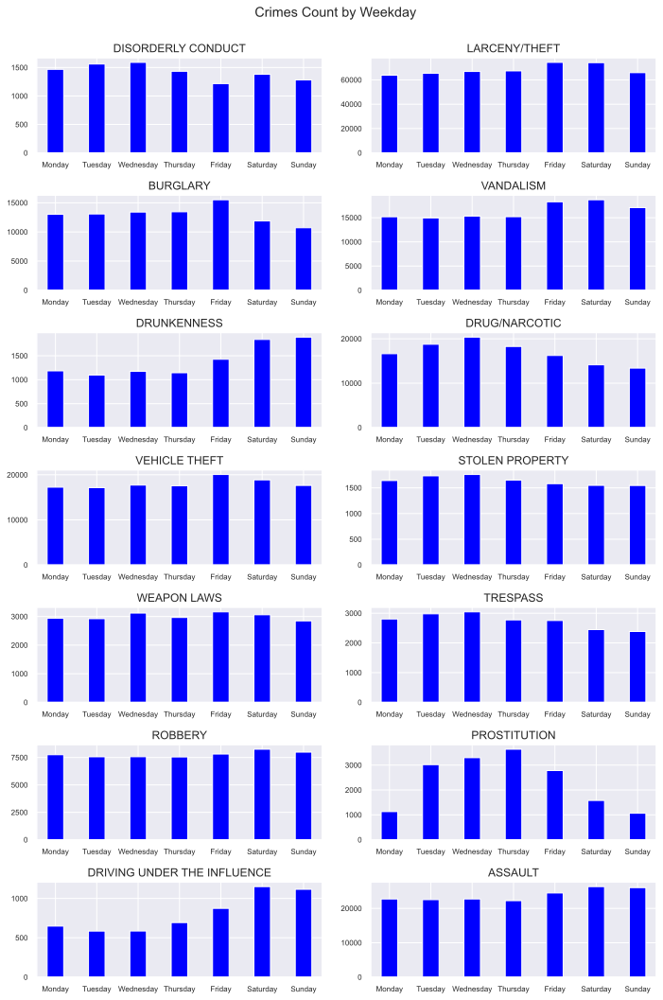

In [44]:
import matplotlib.pyplot as plt
from pandas.api.types import CategoricalDtype

# Create a figure with 7 rows and 2 columns of subplots, and set the size to 10x15 inches
fig, axes = plt.subplots(nrows=7, ncols=2, figsize=(10, 15))

# Adjust the spacing between subplots
fig.tight_layout(h_pad=2.0)

# Adjust the position of the title
fig.subplots_adjust(top=0.93)

# Add a title to the entire figure
fig.suptitle("Crimes Count by Weekday")

# Define the categories and their order
cats = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
cat_type = CategoricalDtype(categories=cats, ordered=True)

# Convert the DayOfWeek column to the categorical type with the defined order
df['DayOfWeek'] = df['DayOfWeek'].astype(cat_type)

# Loop through each crime type and plot the weekly count of that type of crime by weekday
for i, crime_type in enumerate(focuscrimes):
    # Create a new DataFrame that only contains rows with the current crime type
    df_CT = df[df['Category'] == crime_type]
    
    # Group the rows by DayOfWeek and count the number of occurrences of each day
    weekly_CT = df_CT.groupby(df_CT['DayOfWeek']).count()["PdId"]
    
    # Plot the counts as a bar graph in the current subplot with blue color
    axs = weekly_CT.plot(kind='bar', title=crime_type, ax=axes[i//2, i%2], width=0.4, fontsize=8, rot=0, legend=None, color="blue")
    
    # Set the x-axis label to an empty string
    axs.xaxis.set_label_text("")

# Display the plot
plt.show()

We see from these barcharts, prostitution reached its peak on Thursday. Although we don't have evidence to explain why this happens, it's an intriguing phenomenon. Perhaps during normal weekdays, when the police are less busy, they're more likely to respond to a prostitution call. It's even possible that the police conduct larger operations to catch prostitutes during mid-week, when there are "quiet hours."

LARCENY/THEFT had the highest number of reported incidents in the week, making it the most prevalent crime type.

Several crimes, such as DRIVING UNDER THE INFLUENCE, VANDALISM, ASSAULT, and DRUNKENNESS, peak on weekends, which is consistent with common sense. Many studies have shown that alcohol consumption has a direct correlation with the rise in crime levels. Therefore, it is evident that all of the mentioned incidents are influenced by alcohol.

It's intriguing to note that most BURGLARIES occur on Fridays. This could be because people not only go to work during the day but also tend to go out for drinks or parties after work. As a result, Friday is the day when people are less likely to be at home, making it a prime time for BURGLARIES to occur.

# B. Monthely patterns 

In [5]:
df["Date"] = pd.to_datetime(df["Date"])

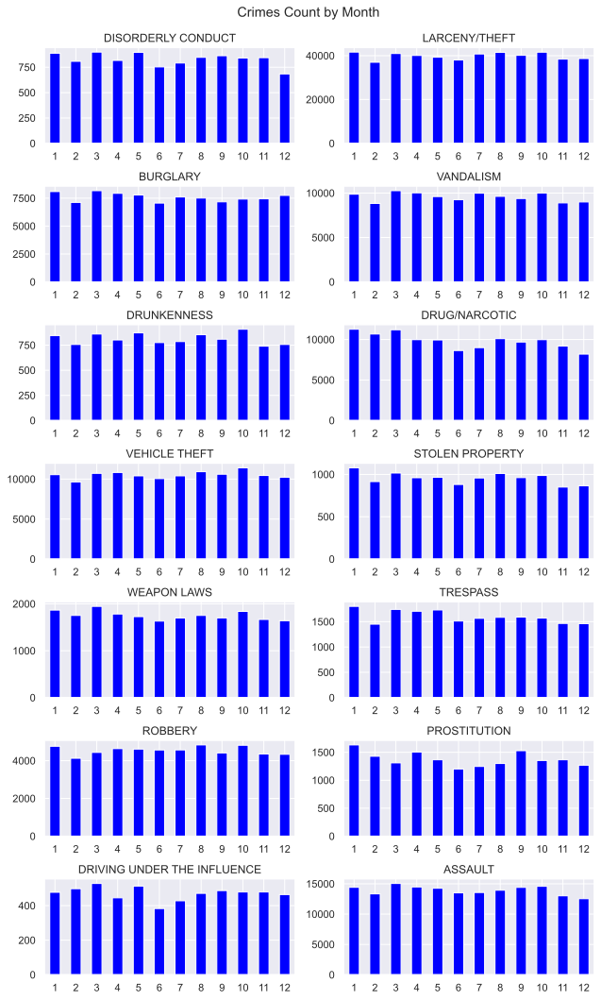

In [6]:
import matplotlib.pyplot as plt

# Create a figure with 7 rows and 2 columns of subplots, and set the size to 9x15 inches
fig, axes = plt.subplots(nrows=7, ncols=2, figsize=(9, 15))

# Adjust the spacing between subplots
fig.tight_layout(h_pad=2.0)

# Adjust the position of the title
fig.subplots_adjust(top=0.94)

# Add a title to the entire figure
fig.suptitle("Crimes Count by Month")

# Loop through each crime type and plot the monthly count of that type of crime
for i, crime_type in enumerate(focuscrimes):
    # Create a new DataFrame that only contains rows with the current crime type
    df_CT = df[df['Category'] == crime_type]
    
    # Group the rows by month and count the number of occurrences of each month
    countByMonth_CT = df_CT.groupby(df['Date'].dt.month).count()["PdId"]
    
    # Plot the counts as a bar graph in the current subplot with blue color and no legend
    axs = countByMonth_CT.plot(kind='bar', title=crime_type, ax=axes[i//2, i%2], legend=None, rot=0, color="blue")
    
    # Set the x-axis label to an empty string
    axs.xaxis.set_label_text("")

# Display the plot
plt.show()


This figure shows the monthly count of each crime type in each subplot by grouping the rows by month and count the number of occurrences of each month for each crime type. The resulting monthly counts are then plotted as bar graphs in each subplot.

When taken as a cycle of months, it can be observed that several crimes experience a slight reduction during winter. In particular, during November and December, crimes such as STOLEN PROPERTY were significantly reduced. Similarly, many types of crime data show a similar pattern of fluctuation, reaching a trough in June and July.

In general, the reported incidents seem to be correlated with the days of the month, except for December, which has 31 days but a smaller count than all the months with 30 days. This might suggest a few things. One possible explanation could be that the police force is reduced during the Christmas holidays, leading to fewer incidents being reported or followed up on. Alternatively, it could be due to more people spending time at home during the holiday season.

# C. The 24 hour cycle Patterns

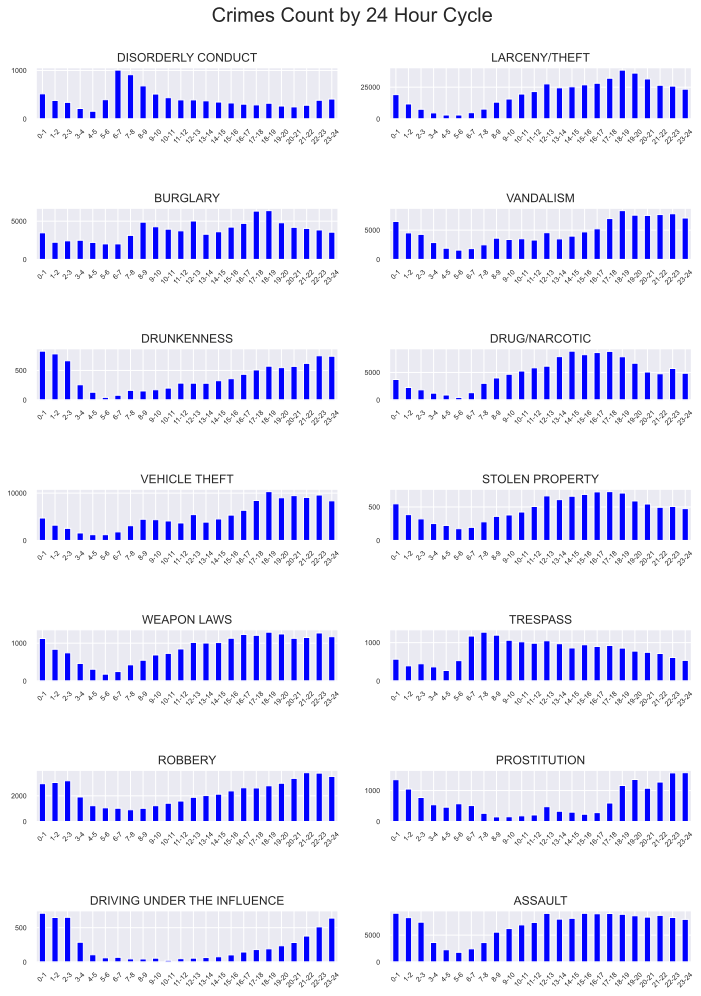

In [7]:
import matplotlib.pyplot as plt

# Create a figure with 7 rows and 2 columns of subplots, and set the size to 10x14 inches
fig, axes = plt.subplots(nrows=7, ncols=2, figsize=(10, 14))

# Adjust the spacing between subplots
fig.tight_layout(h_pad=6)

# Adjust the position of the title
fig.subplots_adjust(top=0.92)

# Add a title to the entire figure with a larger font size
fig.suptitle("Crimes Count by 24 Hour Cycle", fontsize=20)

# Define the x-axis tick labels
xticklabels = ['0-1', '1-2', '2-3', '3-4', '4-5', '5-6', '6-7', '7-8', '8-9', '9-10', '10-11', '11-12', '12-13', '13-14', '14-15', '15-16', '16-17', '17-18', '18-19', '19-20', '20-21', '21-22', '22-23', '23-24']

# Convert the 'Time' column to datetime format
df['Time'] = pd.to_datetime(df['Time'])

# Loop through each crime type and plot the hourly count of that type of crime
for i, crime_type in enumerate(focuscrimes):
    # Create a new DataFrame that only contains rows with the current crime type
    df_CT = df[df['Category'] == crime_type]
    
    # Group the rows by hour and count the number of occurrences of each hour
    countByHour_CT = df_CT.groupby(df['Time'].dt.floor('1H')).count()["PdId"]
    
    # Plot the counts as a bar graph in the current subplot with black color and no legend, and set the x-axis tick labels and label font size
    axs = countByHour_CT.plot(kind='bar', title=crime_type, ax=axes[i//2, i%2], legend=None, rot=45, color="blue", fontsize=7)
    axs.set_xticklabels(xticklabels, fontsize=7)
    axs.xaxis.set_label_text("", fontsize=10)

# Display the plot
plt.show()

In general, most types of crime have the lowest number of reported incidents between 4-6 am in the morning. This is logical since there are fewer people on the streets, resulting in fewer incidents being reported. However, there is one surprising trend where TRESPASSING incidents dramatically increase around 6 am. While this cannot be confirmed, we speculate that homeless individuals may be sleeping in prohibited areas, resulting in them being reported by the police and being forced to leave.

It is evident that DRUNKENNESS follows similar patterns to other crimes such as VANDALISM, DRIVING UNDER THE INFLUENCE, and PROSTITUTION. This observation further confirms that as more people become intoxicated, there is a tendency for a spike in reported incidents.

Although these reports may suggest that it is safer to be on the street from 4-6 am than any other time, there is a factor that has yet to be considered: since there are significantly fewer people on the streets during these hours, there may be a higher incidence rate per person. This cannot be conclusively determined from the data, and it does not necessarily mean that it is safer to be on the streets during the early hours of the day.

Additionally, it appears that there may be two factors contributing to the incidence of ASSAULTs (although this is speculative and not a confirmed fact). The first factor could be that the incidence of ASSAULTs simply increases as more people are out on the streets, committing and reporting these types of crimes. The second factor could be the impact of DRUNKENNESS, which keeps the incidence rate high until around 2-3 am.

# D. 168 hours of the week Patterns

In [8]:
policing_dataframe = pd.read_csv('../files/dataset.csv', parse_dates=[['Date', 'Time']])

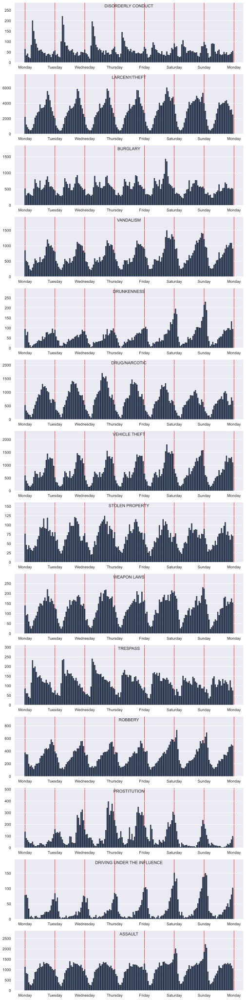

In [9]:
# Create a new column "HourOfWeek" in the policing_dataframe that represents the hour of the week as a continuous number
policing_dataframe["HourOfWeek"] = policing_dataframe["Date_Time"].dt.dayofweek * 24 + policing_dataframe["Date_Time"].dt.hour

# Group the policing_dataframe by "HourOfWeek" and "Category", count the number of occurrences, and reset the index
counts_pr_category_pr_hour_pr_week = policing_dataframe.groupby(by=["HourOfWeek", "Category"]).size().reset_index(name="counts")

# Filter the counts dataframe to only include the categories in the focuscrimes list
counts_pr_category_pr_hour_pr_week = counts_pr_category_pr_hour_pr_week.loc[counts_pr_category_pr_hour_pr_week['Category'].isin(focuscrimes)].reset_index(drop=True)

# Create x-axis values and positions for each day of the week
x_values = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday", "Monday"]
x_position = [0,24,48,72,96,120,144,168]

# Create a new figure with a size of 10x40 inches
plt.figure(figsize=(10,40))

# Iterate over the focuscrimes and plot a separate graph for each crime type
crimes = list(focuscrimes)
for i in range(len(focuscrimes)):
    # Filter the counts dataframe to only include the current crime type
    temp = counts_pr_category_pr_hour_pr_week.loc[counts_pr_category_pr_hour_pr_week['Category'] == crimes[i]].reset_index(drop=True)
    
    # Set the x and y values for the current crime type's graph
    x = temp["HourOfWeek"]
    y = temp["counts"]
    
    # Create a new subplot for the current crime type's graph
    plt.subplot(len(crimes),1,i+1)
    
    # Set the title of the graph to the current crime type
    plt.title(crimes[i], pad=-14)
    
    # Plot a bar chart of the crime counts with black bars and black edges
    plt.bar(x, y, width=0.6, edgecolor="black")
    
    # Set the x-axis tick positions and labels
    plt.xticks(x_position, x_values)
    
    # Set the layout of the subplot
    plt.tight_layout()
    
    # Set the y-axis limit to include some padding above the maximum y value
    plt.ylim(top=(np.max(y)+(np.max(y)*0.3)))
    
    # Add major gridlines to the x-axis with a red color
    plt.grid(which="major", axis="x", color="red")
    
    # Add minor gridlines to the x-axis with a gray color
    plt.grid(which="minor", axis="x", color="gray")
    
# Show the figure with all the subplots
plt.show()


The output graph shows the count of crimes for each day of the week and each hour of the day for the specified categories of crimes. The graph has a separate subplot for each category of crime, with the title of the category at the top of each subplot. The x-axis of each subplot shows the hours of the day, from 0 to 168 (representing 24 hours per day and 7 days per week), with major gridlines at each day boundary and minor gridlines at each hour boundary. The y-axis shows the count of crimes for each hour of the day. Each bar in the graph represents the count of crimes for a specific hour of the day for the corresponding day of the week. For example, the first bar in each subplot represents the count of crimes that occurred from midnight to 1am on Monday, the second bar represents the count of crimes that occurred from 1am to 2am on Monday, and so on. The color of the bars is black, and the width of the bars is 0.6.

# 2. Calendar Plot

In [11]:
pip install calplot

  Using cached calplot-0.1.7.5.tar.gz (132 kB)
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for calplot: filename=calplot-0.1.7.5-py3-none-any.whl size=8117 sha256=9a9962684b3b714de734c798209ebf75fd47e8a61958cb20655bc052213d9e4d
  Stored in directory: c:\users\sulai\appdata\local\pip\cache\wheels\a4\51\68\89dbd39aa6abbe8e34f410a810421335b157fb162b99841c30
Successfully built calplot
Note: you may need to restart the kernel to use updated packages.


In [12]:
import numpy as np; np.random.seed(sum(map(ord, 'calplot')))
import pandas as pd

import calplot

# Load the data
df = pd.read_csv('../files/dataset.csv')

# Filter the data for drunkenness crimes
df_drunkenness = df[df['Category'] == 'DRUNKENNESS']

# Convert the date column to a datetime object
df_drunkenness['Date'] = pd.to_datetime(df_drunkenness['Date'])

# Create a Series of 1's with the date as the index
events = pd.Series(1, index=df_drunkenness['Date'])

# Plot the calendar
calplot.calplot(events, cmap='Blues', edgecolor=None)

C:\Users\Sulai\AppData\Local\Temp\ipykernel_1108\1536550588.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_drunkenness['Date'] = pd.to_datetime(df_drunkenness['Date'])
findfont: Font family ['Helvetica'] not found. Falling back to DejaVu Sans.


(<Figure size 1000x2720 with 16 Axes>,
 array([<AxesSubplot:ylabel='2003'>, <AxesSubplot:ylabel='2004'>,
        <AxesSubplot:ylabel='2005'>, <AxesSubplot:ylabel='2006'>,
        <AxesSubplot:ylabel='2007'>, <AxesSubplot:ylabel='2008'>,
        <AxesSubplot:ylabel='2009'>, <AxesSubplot:ylabel='2010'>,
        <AxesSubplot:ylabel='2011'>, <AxesSubplot:ylabel='2012'>,
        <AxesSubplot:ylabel='2013'>, <AxesSubplot:ylabel='2014'>,
        <AxesSubplot:ylabel='2015'>, <AxesSubplot:ylabel='2016'>,
        <AxesSubplot:ylabel='2017'>, <AxesSubplot:ylabel='2018'>],
       dtype=object))

WE choosed to visualize "**Drunkenness**" Crime type

The previous chart is a calendar plot that shows the frequency of drunkenness crimes in San Francisco for each month of the year. The plot is a calendar grid where each cell represents a day in a month, and the color of the cell represents the frequency of drunkenness crimes that occurred on that day.

The color map used in the plot ranges from light blue for days with no crimes to dark blue for days with a high number of crimes. The darker the blue color, the higher the frequency of crimes that occurred on that day.

From the plot, we can see that the frequency of drunkenness crimes in San Francisco is highest in the summer months of July and August. There is a significant drop in the frequency of crimes in the fall and winter months, with the lowest frequency occurring in December and January.

The chart clearly shows that the frequency of drunkenness crimes in San Francisco follows a distinct seasonal pattern. The highest frequency of crimes occurs in the summer months, which is a time when many people are out and about, attending events, and enjoying the city's nightlife. This pattern is consistent with other studies that have shown an increase in alcohol-related incidents during the summer months.

Although the chart doesn't show geographic information, it's likely that the frequency of drunkenness crimes also varies by location in San Francisco. For example, areas with a high concentration of bars and nightlife establishments may have a higher frequency of crimes than residential neighborhoods. Identifying these high-risk areas and targeting them with increased police presence or other interventions could help reduce the overall frequency of crimes in the city.

The information from this chart can be used to educate the public about the most dangerous times and areas in San Francisco, which can help people take precautions and stay safe.

# 3. Polar plot

C:\Users\Sulai\AppData\Local\Temp\ipykernel_1108\727631623.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_robbery['Time'] = pd.to_datetime(df_robbery['Time'], format='%H:%M')


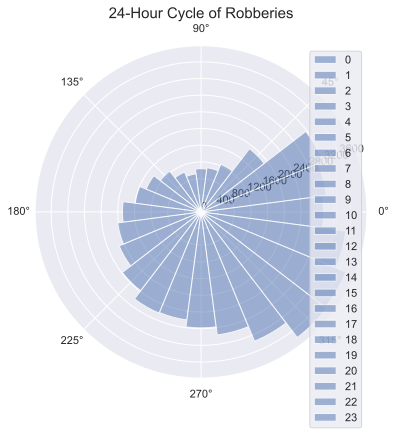

In [13]:


# Filter the data for robbery crimes
df_robbery = df[df['Category'] == 'ROBBERY']

# Convert the time column to datetime object
df_robbery['Time'] = pd.to_datetime(df_robbery['Time'], format='%H:%M')

# Get the count of robberies for each hour of the day
counts_per_hour = df_robbery['Time'].dt.hour.value_counts().sort_index()

# Create a list of hours (in order)
hours = np.arange(24)

# Count the number of robberies at each hour
hourly_counts = [counts_per_hour.get(h, 0) for h in hours]

# Create a polar plot
fig = plt.figure(figsize=(6, 6))
ax = fig.add_subplot(111, projection='polar')

# Set the angles and radii
theta = np.linspace(0, 2 * np.pi, 24, endpoint=False)
radii = hourly_counts

# Plot the bars
bars = ax.bar(theta, radii, width=2 * np.pi / 24, alpha=0.5)

# Set the title and legend
ax.set_title('24-Hour Cycle of Robberies', fontsize=15)
ax.legend(bars, hours, loc='best')

# Set the y-axis to be in integers only
ax.yaxis.set_major_locator(plt.MaxNLocator(integer=True))

# Show the plot
plt.show()

This time we choosed to visualize" **Robberies**" crime type

The previous chart is a polar bar chart that shows the 24-hour cycle of robbery crimes in San Francisco. The chart is divided into 24 equal segments, with each segment representing an hour of the day. The length of each bar represents the number of robbery crimes that occurred during that hour.

Looking at the chart, we can see that the number of robbery crimes in San Francisco is highest during the evening hours, between 6 PM and midnight. The peak time for robbery crimes is between 8 PM and 10 PM, with a significant drop-off in the number of crimes after midnight. The number of robberies is lowest in the early morning hours, between 4 AM and 6 AM, with very few crimes occurring during these hours.

The information from this chart can be used to educate the public about the most dangerous times and areas in San Francisco, which can help people take precautions and stay safe.

## A1 Part 2: Dataviz questions 

`**Have a look at the encoding dataviz lecture (Week 4), then answer the following questions in your own words. **`

* `Mention 10 examples of ways we can encode data.`


Ten examples of ways we can encode data include:

**1- Bar charts:** Used to represent the sales of each month in a store or other numerical quantities, bar charts use length to represent values, making them easy to read and interpret.

**2- Pie charts:** Although often criticized for being difficult to read accurately, pie charts can be useful in displaying the ownership of a certain stock or other categorical data. Pie charts use angles to represent values, but can be misleading if the differences in angle are not easily distinguishable.

**3- Geoencoding:** This involves mapping latitude and longitude on a map, such as in the case of the San Francisco crime incident reports, to estimate where most crimes are reported.

**4- Time series plots:** Used to represent data over time, time series plots can show the sales over time with months on the x-axis, or total sales (y-axis 1) and the amount of visitors to a webpage (y-axis 2) with months on the x-axis. Time series plots use position encoding to represent values.

**5- Density estimation:** Used to estimate the density of data points in a given area, density estimation can be used to create heatmaps or contour plots to visually represent the distribution of data.

**6-Linear fit:** Used to show the relationship between two variables, linear fits can be used to plot the correlation between sales and visitors to a webpage, for example.

**7-Network data:** Used to show the links between different components, network data can be represented as nodes and edges to show how different entities are connected. This can be used, for example, to show who knows whom in a social network.

**8- Hierarchical data:** Used to represent data in a hierarchy, hierarchical data can be shown as a dendrogram or a family tree to demonstrate the relationships between different entities.

**9- Scatter plots:** Used to represent the relationship between two variables, scatter plots use position encoding to show how the values of the two variables change in relation to one another.

**10- Choropleth maps:** Used to represent data on a map, choropleth maps use color hue to represent values for different regions, such as different countries or states.

`* Are all encodings created equally? Why not? Can you think of an example from the previous lectures?`

No, not all encodings are created equally. Some encodings may be more effective than others depending on the specific data being visualized, the message the visualization is trying to convey, and the audience who will be viewing the visualization.

For example, certain encodings may be better suited for showing patterns over time, while others may be more effective at comparing values between categories. In addition, some encodings may be more intuitive or easier for viewers to interpret, while others may be more challenging or require additional explanation.

An example from the previous lectures is the discussion of encoding data using color. While color can be a powerful way to represent information, it can also be difficult for viewers to interpret if not used effectively. For example, using too many colors or using colors that are too similar can make it difficult for viewers to differentiate between categories or understand the meaning of the data being presented. On the other hand, using a well-designed color scheme can help to enhance the visualization and make it more effective at conveying information.

`* Mention 3 encodings that are difficult for the human eye to parse. Can you find an example of a visualization online that uses one of those three?`


Three encodings that are difficult for the human eye to parse are:

**1- Angle encoding:** Humans are generally less accurate at judging differences in angle than differences in length or position. Therefore, using angle encoding to represent values can be challenging for viewers. An example of a visualization that uses angle encoding is the classic pie chart, which represents values as different sized wedges of a circle.

**2- Area encoding:** Similar to angle encoding, area encoding can be challenging for the human eye to interpret. Our brains are better at judging differences in length and position than differences in area. An example of a visualization that uses area encoding is a bubble chart, where the size of bubbles represents the value of a third variable.

**3- Color saturation:** Using color saturation to represent values can be challenging because it can be difficult to judge differences in saturation accurately. For example, a gradient that fades from light to dark can make it difficult to determine the precise value associated with a particular shade. An example of a visualization that uses color saturation encoding is a heat map, where the intensity of color represents the value of a variable.
One example of a visualization that uses angle encoding is the classic pie chart, which can be seen in various business and media reports. One example of a visualization that uses area encoding is a bubble chart used to represent demographic data, such as in the visualization of the world's population by country. Finally, an example of a visualization that uses color saturation encoding is a heat map used to represent weather patterns, such as in the visualization of temperature changes in different regions of the world.


`* Explain in your own words: What is the problem with pie-charts?`

The problem with pie charts is that they can be difficult to read accurately and compare values between slices. This is because our eyes are better at judging differences in length and position than differences in angles and areas. In addition, pie charts are not effective for showing comparisons between more than a few categories or for showing trends over time, as the size of the slices can change even if the values remain constant. As a result, pie charts are often criticized for being misleading or confusing, especially in situations where accurate interpretation of data is critical.

## A1 Part 3: Visualizing geodata using Plotly

In this sub-assignment I want you to create a choropleth map of San Francisco, showing where it's safest to leave your car on Sundays, following the instructions from Week 3.

When you're done, reflect on the following questions.

* Based on your map and analysis, where should you park the car for it to be safest on a Sunday? And where's the worst place?
* Using visualizatios can help us uncover powerful data-patterns. However, when designing visualizations, we need to be aware of several illusions that can lead viewers to misinterpret the data we are showing (i.e. perceptual errors):
   - Try to change the range of data-values in the plot above. Is there a way to make the difference between district less evident?
   - Why do you think perceptual errors are a problem? Try to think of a few examples. 

`3.1 Based on your map and analysis, where should you park the car for it to be safest on a Sunday? And where's the worst place?`

Creating a dictionary of random data

In [27]:
randomdata = {'CENTRAL': 0.8903601342256143,
 'SOUTHERN': 0.8642882941363439,
 'BAYVIEW': 0.925634097746596,
 'MISSION': 0.7369022697287458,
 'PARK': 0.9864113307070926,
 'RICHMOND': 0.5422239624697017,
 'INGLESIDE': 0.5754056712571605,
 'TARAVAL': 0.5834730737348696,
 'NORTHERN': 0.08148199528212985,
 'TENDERLOIN': 0.37014287986350447};

Loads San Francisco Police Department district shapefiles

In [28]:
import json

with open("../files/sfpd.geojson") as geodata:
    district = json.load(geodata)

Converts it into a DataFrame

In [29]:
data = pd.DataFrame.from_dict(randomdata, orient='index').reset_index()
data.columns = ['DISTRICT','VALUE']

This code generates a choropleth map by utilizing data from the DataFrame and district shapefiles. The resulting map visualizes the varying levels of crime rates across different districts within San Francisco.

In [30]:
import plotly.express as px
fig = px.choropleth_mapbox(data, geojson=district, locations='DISTRICT', color='VALUE',
                           color_continuous_scale="Viridis",
                           range_color=(0, 0,6),
                           mapbox_style="carto-positron",
                           zoom=11, center = {"lat": 37.769, "lon": -122.41},
                           opacity=0.5, title = '<br>''MAP',
                           labels={'Crime':'Crime rate'}
                          )
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.layout.title
fig.show()

Importing the Crime Data

In [31]:
data = pd.read_csv("../files/dataset.csv")

Creating Year Column

In [32]:
data['Year'] = data['Date'].str.strip().str[-4:]

Focus Crimes

In [33]:
focus_crimes = set(['WEAPON LAWS', 'PROSTITUTION', 'DRIVING UNDER THE INFLUENCE', 'ROBBERY', 'BURGLARY', 'ASSAULT', 'DRUNKENNESS', 'DRUG/NARCOTIC', 'TRESPASS', 'LARCENY/THEFT', 'VANDALISM', 'VEHICLE THEFT', 'STOLEN PROPERTY', 'DISORDERLY CONDUCT'])

focus_data = data[['Category', 'PdDistrict', 'Year', 'DayOfWeek']].copy()
focus_data = focus_data[focus_data['Category'].isin(focus_crimes)].reset_index(drop=True)
focus_data = focus_data.drop(focus_data[focus_data['Year'] == '2018'].index)
focus_data.drop(columns=['Year'], inplace=True)
focus_data = focus_data[focus_data['Category'] == 'VEHICLE THEFT']
focus_data.drop(columns=['Category'], inplace=True)
focus_data.reset_index(drop=True, inplace=True)

Grouped Data

In [34]:
grouped_data = pd.DataFrame(focus_data.groupby(["PdDistrict"])["DayOfWeek"].value_counts())
grouped_data.columns = ['VALUE']
grouped_data.reset_index(inplace=True)
grouped_data.columns = ['DISTRICT','DayOfWeek','VALUE']

Selecting Day and Plotting Map

In [35]:
def select_day(day, data):
    data_day = data[data['DayOfWeek'] == day]
    data_day = data_day.drop(columns=['DayOfWeek'])
    data_day.reset_index(drop=True, inplace=True)
    
    fig = px.choropleth_mapbox(data_day, geojson=district, locations='DISTRICT', color='VALUE',
                               color_continuous_scale="Viridis",
                               range_color=(data_day['VALUE'].min(axis=0), data_day['VALUE'].max(axis=0)),
                               mapbox_style="carto-positron",
                               zoom=11, center = {"lat": 37.769, "lon": -122.41},
                               opacity=0.5, title = '<br>''{}'.format(day),
                               labels={'Crime':'Crime rate'}
                          )
    fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
    fig.layout.title
    fig.show()
    
select_day('Sunday', grouped_data)

Based on the map and analysis:

 The best car parking districts on Sundays are:

**TARAVAL**: The southernmost district has the lowest vehicle theft rate on Sundays compared to other districts.

**RICHMOND**: The westernmost district has the second-lowest vehicle theft rate on Sundays.

The worst car parking district on Sundays is:

**TENDERLOIN:** The central district has the highest vehicle theft rate on Sundays compared to other districts.
It is important to note that this analysis is based on historical data and that vehicle theft rates can vary depending on various factors, including time of day and season. It is always important to take precautions to secure your vehicle and belongings, no matter where you park.

`3.2.a Try to change the range of data-values in the plot above. Is there a way to make the difference between district less evident?`



To make the difference between districts less evident in the plot above, we can adjust the color scale to a narrower range. For example, we can set the range_color parameter to (0, 0.6) instead of (0, 1). This will result in a smaller range of colors being used to represent the data, which should make the differences between districts less pronounced.



`3.2.b` `Why do you think perceptual errors are a problem? Try to think of a few examples.`

Perceptual errors can be a problem because they can lead to incorrect interpretations of the data being presented, which can in turn lead to poor decisions or actions. For example, if a graph is designed to exaggerate the differences between data points, it may lead viewers to think that those differences are more significant than they actually are. This can lead to misguided decisions or actions based on faulty assumptions. Another example is when a graph is designed to use a color scheme that is difficult for some viewers to distinguish (e.g. red-green colorblindness). This can lead to certain viewers misinterpreting the data or being unable to interpret it at all.

In [36]:
data = pd.DataFrame.from_dict(randomdata, orient='index').reset_index()
data.columns = ['DISTRICT','VALUE']

In [37]:
import plotly.express as px
fig = px.choropleth_mapbox(data, geojson=district, locations='DISTRICT', color='VALUE',
                           color_continuous_scale="Viridis",
                           range_color=(0, 0.6),
                           mapbox_style="carto-positron",
                           zoom=11, center = {"lat": 37.769, "lon": -122.41},
                           opacity=0.5, title = '<br>''MAP',
                           labels={'Crime':'Crime rate'}
                          )
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.layout.title
fig.show()

## A1 Part 4: Errors in the data

We started the course by plotting simple histogram and bar plots that showed a lot of cool patterns. But sometimes the binning can hide imprecision, irregularity, and simple errors in the data that could be misleading. In the work we've done so far, we've already come across at least three examples of this in the SF data (listed in Part 3 of Week 4). 

The data errors we discovered at the end of Week 4 become difficult to notice when we aggregate data (and when we calculate mean values, as well as statistics more generally). Thus, when we visualize, errors become difficult to notice when binning the data. We explore this process in the exercise below.

`The three examples of data errors in the SF data are:`

A) In the temporal activity for PROSTITUTION, there is a surprising spike on Thursdays, which might be due to data entry errors.

B) Jitter-plots showed that many more crimes were recorded on the hour, 15 minutes past the hour, and to a lesser extent, in whole increments of 10 minutes. Crimes didn't appear to be recorded as frequently in between those round numbers.

C) The Hall of Justice on the 800 block of Bryant street appears to be an unlikely hotspot for sex offenses, which might be due to data entry errors.


`* In each of the 3 examples we listed during Week 4, describe in your own words how the data-errors I call attention to above can bias the binned versions of the data.`




A) Temporal activity for PROSTITUTION: The data shows a surprising peak in prostitution crimes on Thursdays. However, when we look closer at the timestamps, we see that many more crimes were recorded at round numbers like the hour, 15 minutes past the hour, and whole increments of 10 minutes. This means that the actual activity might be spread more evenly across the week, but the binning of the data is masking this pattern.

B) Timestamps recorded for all crimes: When we plotted the timestamps using jitter-plots, we saw that many crimes were recorded at round numbers, but not as frequently in between. This means that the raw data shows more irregularity than the binned version, and we might be missing important details about the actual patterns of crime.

c) Hotspot for sex offences: The Hall of Justice on the 800 block of Bryant street seems to be an unlikely hotspot for sex offences, but this is likely due to a data error where the crimes are being misclassified as prostitution. This means that the actual patterns of sex offences might be different, but the binning of the data is hiding this detail.

In all of these examples, the binning of the data can hide important details about the actual patterns in the data. By not taking a closer look at the raw data, we might miss important insights about the actual trends and patterns in San Francisco.



`* Also, briefly mention how not noticing these errors can result in misconceptions about the underlying patterns of what's going on in San Francisco (and our modeling).`

Not noticing these errors can lead to incorrect interpretations of the data and can lead to incorrect conclusions about the underlying patterns of what's going on in San Francisco. For example, in the case of the PROSTITUTION data on Thursdays, if we were to simply look at a binned histogram, we might assume that prostitution is more prevalent on Thursdays when in reality, this could just be an artifact of how the data is recorded. Similarly, if we were to assume that the Hall of Justice on the 800 block of Bryant street is actually a hotspot for sex offences based on binned data, we could be making incorrect assumptions and taking incorrect actions based on those assumptions. These errors can have real-world consequences, so it is important to carefully examine the data for any errors or biases before making any conclusions or decisions.


`* Find your own example of human noise in the data and visualize it.`

One example of human noise in data could be typos or misspellings of location names. For instance, in the San Francisco crime dataset, we may find instances where the same location has been recorded with different spellings or slight variations in the address. This can create confusion when trying to analyze patterns of crime in different locations.

To visualize this, we can plot a bar chart showing the frequency of crimes in different locations. However, to account for the human noise in the data, we can preprocess the data to standardize the location names. For example, we can use regular expressions to replace common misspellings or variations of the same location name with a standardized name. Then we can plot the frequency of crimes in each standardized location using a bar chart. This will give us a more accurate picture of crime patterns in different areas of San Francisco.